In [2]:
import pandas as pd
import tensorflow as tf
import tensorflow_probability as tfp
import plotly as plt
import plotly.express as px
import numpy as np
import scipy.stats
import tensorflow_addons as tfa
import dateparser
from bioinfokit.analys import stat

tfkl = tf.keras.layers
tfk = tf.keras
tfd = tfp.distributions
tfko = tf.keras.optimizers
tfpl = tfp.layers
tfb = tfp.bijectors

# Ripe rimu in 2002 and 2019 on Whenua Hou, 2016 and 2019 on Anchor

ModuleNotFoundError: No module named 'bioinfokit'

In [3]:
age = pd.read_csv("kakapo_age.tsv", index_col=1)["age"].to_dict()
birth_year = pd.read_csv("kakapo_age.tsv", index_col=1)["year"].to_dict()
birth_year

{'Zephyr': 1981,
 'Nora3.3.81': 1981,
 'Heather': 1981,
 'Nora1.3.85': 1985,
 'Sue2.2.85': 1985,
 'Chubb': 1985,
 'Tara M': 1985,
 'Heather1.1.90': 1990,
 'Dobbie': 1991,
 'Wendy2.3.91': 1991,
 'Bart': 1991,
 'Stumpy': 1991,
 'Alf': 1992,
 'Margaret-maree3.3.92': 1992,
 'Suzanne1.3.92': 1992,
 'Bj': 1992,
 'Zephyr3.3.92': 1992,
 'Hoki': 1992,
 'Wendy1.3.93': 1993,
 'Gromit': 1997,
 'Cyndy2.3.97': 1997,
 'Sirocco': 1997,
 'Tiwai': 1997,
 'Manu': 1997,
 'Kuia': 1998,
 'Gulliver': 1998,
 'Sinbad': 1998,
 'Alice2-3-99a': 1999,
 'Alice3-3-99a': 1999,
 'Hauturu': 1999,
 'Ellie': 1999,
 'Aranga': 1999,
 'Trevor': 1999,
 'Boomer': 1999,
 'Morehu': 1999,
 'Rakiura': 2002,
 'F2-2002': 2002,
 'Horton': 2002,
 'Esperance': 2002,
 'Tumeke': 2002,
 'Mila': 2002,
 'Cyndy2.3a.02': 2002,
 'Hine Taumai': 2002,
 'Doc': 2002,
 'Monoa': 2002,
 'Vollie': 2002,
 'Kuihi': 2002,
 'Takitimu': 2002,
 'Aparima': 2002,
 'Marama': 2002,
 'Pearl': 2002,
 'Konini': 2002,
 'Blake': 2002,
 'Ariki': 2002,
 'Te Kingi': 2

In [4]:
characters = pd.read_csv("../Characters/kakapo_characters.csv")
eggs = characters[["birdName", "sex", "alive", "dateLaid", "dateHatched", "motherName", "nestMotherName", "layIsland", "length", "width", "weight"]]
for i, x in eggs.iterrows():

    # measurement = dt.datetime.strptime(x['dateHatched'], '%d/%m/%Y %H:%M')
    measurement = dateparser.parse(str(x["dateLaid"]))

    eggs.loc[i, "day"] = measurement.timetuple().tm_yday
    eggs.loc[i, "month"] = measurement.month
    eggs.loc[i, "year"] = str(measurement.year)
    eggs.loc[i, "yearmonth"] = str(measurement.year) + " " + str(measurement.month)

eggs['ratio'] = eggs['width']/eggs['length']
eggs['weight_standin'] = eggs['width']*eggs['length']
# Drop outliers
eggs.drop(eggs[eggs['ratio'] > 1].index, inplace=True)
eggs['year'] = eggs['year'].astype("int")
# eggs['fakeage'] = eggs['year'] - 1981 + 1
eggs = eggs.dropna(axis=0, subset=["motherName"])
eggs = eggs.dropna(axis=0, subset=["ratio"])
eggs['motherBirthYear'] = eggs['motherName'].map(lambda x: birth_year.get(x, np.nan))
eggs['motherAge'] = eggs['year'] - eggs['motherBirthYear']
eggs

/home/josephguhlin/miniconda3/envs/kakapophenos_new/lib/python3.10/site-packages/dateparser/date_parser.py:35: PytzUsageWarning: The localize method is no longer necessary, as this time zone supports the fold attribute (PEP 495). For more details on migrating to a PEP 495-compliant implementation, see https://pytz-deprecation-shim.readthedocs.io/en/latest/migration.html
  date_obj = stz.localize(date_obj)
/tmp/ipykernel_2564913/2202020259.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eggs.loc[i, "day"] = measurement.timetuple().tm_yday
/tmp/ipykernel_2564913/2202020259.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in 

,birdName,sex,alive,dateLaid,dateHatched,motherName,nestMotherName,layIsland,length,width,weight,day,month,year,yearmonth,ratio,weight_standin,motherBirthYear,motherAge
0,Acheron,Male,True,2019-02-15 01:00:00,2019-03-17 07:20:00,Kuia,Roha,Anchor,49.59,39.21,NaN,46.0,2.0,2019,2019 2,0.790684,1944.4239,1998.0,21.0
1,Adelaide,Female,True,2016-02-26 22:00:00,2016-03-25 07:15:00,Kuia,Hauturu,Anchor,49.55,37.60,NaN,57.0,2.0,2016,2016 2,0.758829,1863.0800,1998.0,18.0
3,Aio,Female,True,2019-01-17 13:30:00,2019-02-13 19:27:00,Mila,Atareta,Anchor,49.50,39.33,NaN,17.0,1.0,2019,2019 1,0.794545,1946.8350,2002.0,17.0
4,Ako,Female,True,2019-02-13 23:00:00,2019-03-14 00:34:00,Esperance,Esperance,Whenua Hou,43.69,33.88,NaN,44.0,2.0,2019,2019 2,0.775463,1480.2172,2002.0,17.0
5,Al,Male,False,2002-02-13 00:00:00,2002-03-15 05:30:00,Alice,Hoki,Whenua Hou,53.80,36.90,39.25,44.0,2.0,2002,2002 2,0.685874,1985.2200,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
754,Zephyr-3-A-19,NaN,False,2019-02-12 20:30:00,NaN,Zephyr,Zephyr,Whenua Hou,53.84,39.11,NaN,43.0,2.0,2019,2019 2,0.726412,2105.6824,1981.0,38.0
755,Zephyr1.3a.02,NaN,False,2002-02-07 00:00:00,NaN,Zephyr,NaN,Whenua Hou,51.80,40.90,44.75,38.0,2.0,2002,2002 2,0.789575,2118.6200,1981.0,21.0
756,Zephyr2.2b.02,Male,False,2002-03-15 00:00:00,NaN,Zephyr,NaN,Whenua Hou,54.10,39.60,42.50,74.0,3.0,2002,2002 3,0.731978,2142.3600,1981.0,21.0
757,Zephyr2.3a.02,NaN,False,2002-02-10 00:00:00,NaN,Zephyr,NaN,Whenua Hou,53.10,40.50,45.25,41.0,2.0,2002,2002 2,0.762712,2150.5500,1981.0,21.0


In [5]:
eggs[eggs['motherAge'] <= 0]

,birdName,sex,alive,dateLaid,dateHatched,motherName,nestMotherName,layIsland,length,width,weight,day,month,year,yearmonth,ratio,weight_standin,motherBirthYear,motherAge


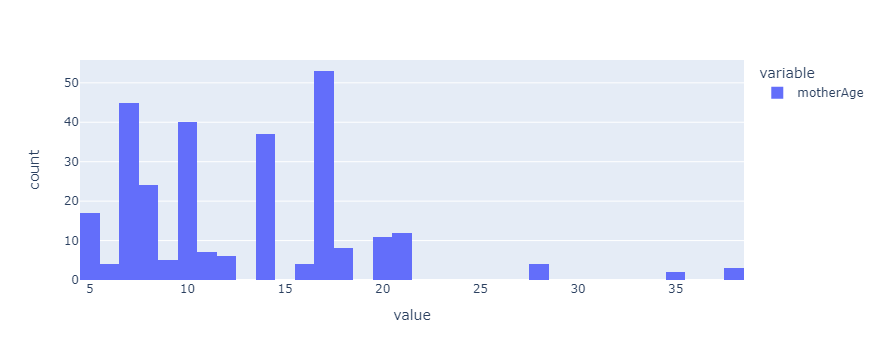

In [6]:
px.histogram(eggs['motherAge'])

In [7]:
eggs_ageknown = eggs.dropna(subset=["motherAge"])
eggs_ageknown

,birdName,sex,alive,dateLaid,dateHatched,motherName,nestMotherName,layIsland,length,width,weight,day,month,year,yearmonth,ratio,weight_standin,motherBirthYear,motherAge
0,Acheron,Male,True,2019-02-15 01:00:00,2019-03-17 07:20:00,Kuia,Roha,Anchor,49.59,39.21,NaN,46.0,2.0,2019,2019 2,0.790684,1944.4239,1998.0,21.0
1,Adelaide,Female,True,2016-02-26 22:00:00,2016-03-25 07:15:00,Kuia,Hauturu,Anchor,49.55,37.60,NaN,57.0,2.0,2016,2016 2,0.758829,1863.0800,1998.0,18.0
3,Aio,Female,True,2019-01-17 13:30:00,2019-02-13 19:27:00,Mila,Atareta,Anchor,49.50,39.33,NaN,17.0,1.0,2019,2019 1,0.794545,1946.8350,2002.0,17.0
4,Ako,Female,True,2019-02-13 23:00:00,2019-03-14 00:34:00,Esperance,Esperance,Whenua Hou,43.69,33.88,NaN,44.0,2.0,2019,2019 2,0.775463,1480.2172,2002.0,17.0
30,Alison,Female,True,2019-01-30 15:40:00,2019-03-03 18:41:00,Queenie,Handraise,Whenua Hou,49.87,36.71,NaN,30.0,1.0,2019,2019 1,0.736114,1830.7277,2009.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
754,Zephyr-3-A-19,NaN,False,2019-02-12 20:30:00,NaN,Zephyr,Zephyr,Whenua Hou,53.84,39.11,NaN,43.0,2.0,2019,2019 2,0.726412,2105.6824,1981.0,38.0
755,Zephyr1.3a.02,NaN,False,2002-02-07 00:00:00,NaN,Zephyr,NaN,Whenua Hou,51.80,40.90,44.75,38.0,2.0,2002,2002 2,0.789575,2118.6200,1981.0,21.0
756,Zephyr2.2b.02,Male,False,2002-03-15 00:00:00,NaN,Zephyr,NaN,Whenua Hou,54.10,39.60,42.50,74.0,3.0,2002,2002 3,0.731978,2142.3600,1981.0,21.0
757,Zephyr2.3a.02,NaN,False,2002-02-10 00:00:00,NaN,Zephyr,NaN,Whenua Hou,53.10,40.50,45.25,41.0,2.0,2002,2002 2,0.762712,2150.5500,1981.0,21.0


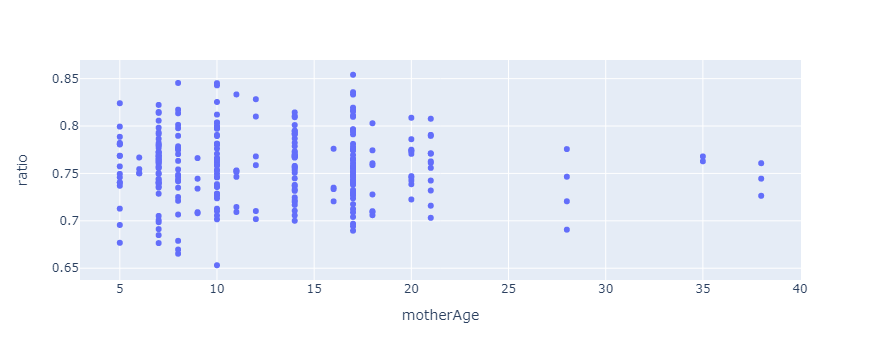

In [8]:
px.scatter(eggs_ageknown, x="motherAge", y="ratio")

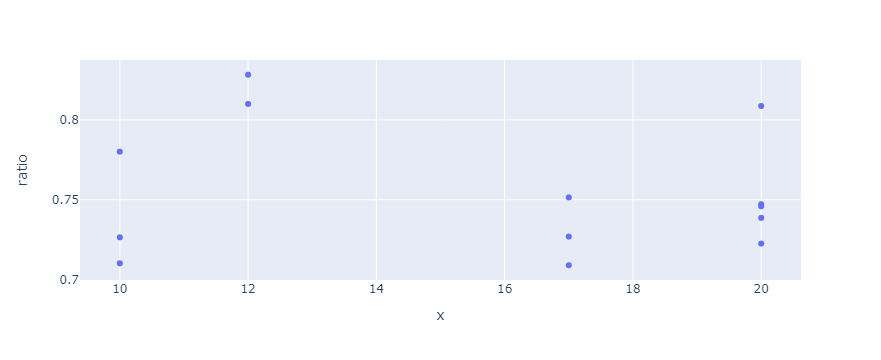

In [554]:
single = eggs_ageknown[eggs_ageknown['motherName'] == "Aranga"]
b = tfb.GompertzCDF(0.05, 0.02)
px.scatter(single, x=single["motherAge"].astype("float32"), y="ratio")

In [555]:
np.corrcoef(eggs_ageknown['motherAge'], eggs_ageknown['ratio'])

array([[ 1.        , -0.02237442],
       [-0.02237442,  1.        ]])

In [487]:
np.corrcoef(tfb.FrechetCDF()(eggs_ageknown['motherAge']), eggs_ageknown['ratio'])

array([[1.        , 0.00562034],
       [0.00562034, 1.        ]])

In [488]:
np.corrcoef(eggs_ageknown['motherAge'], eggs_ageknown['ratio'])

array([[ 1.        , -0.02237442],
       [-0.02237442,  1.        ]])

In [490]:
np.corrcoef(eggs_ageknown['motherAge'], tfb.FrechetCDF()(eggs_ageknown['ratio']))

array([[ 1.        , -0.02057699],
       [-0.02057699,  1.        ]])

In [491]:
np.corrcoef(tfb.FrechetCDF()(eggs_ageknown['motherAge']), tfb.FrechetCDF()(eggs_ageknown['ratio']))

array([[1.        , 0.00648604],
       [0.00648604, 1.        ]])

In [9]:
ea = eggs_ageknown
ea.groupby(["motherName", "year"]).mean()

alive  length      width  weight        day  month  \
motherName year                                                          
Aparima    2008  0.500000  48.650  37.000000  35.900  58.500000    2.0   
           2009  0.000000  50.050  38.566667     NaN  47.000000    2.0   
           2019  0.800000  51.116  38.584000     NaN  35.800000    1.8   
Aranga     2009  0.333333  49.950  36.850000     NaN  37.000000    2.0   
           2011  0.500000  48.555  39.770000  41.075  52.500000    2.0   
...                   ...     ...        ...     ...        ...    ...   
Zephyr     1999  1.000000  53.750  39.850000  46.000  57.500000    2.0   
           2002  0.000000  52.740  40.040000  43.800  53.600000    2.4   
           2009  1.000000  53.450  40.675000     NaN  52.500000    2.0   
           2016  0.000000  53.210  40.725000     NaN  68.500000    3.0   
           2019  0.000000  53.510  39.800000     NaN  42.333333    2.0   

                    ratio  weight_standin  motherBirthYear  motherAge  
motherName year                                                        
Aparima    2008  0.760667      1800.57500           2002.0        6.0  
           2009  0.771097      1930.27500           2002.0        7.0  
           2019  0.755148      1972.13646           2002.0       17.0  
Aranga     2009  0.738920      1840.68750           1999.0       10.0  
           2011  0.819166      1931.01720           1999.0       12.0  
...                   ...             ...              ...        ...  
Zephyr     1999  0.742262      2140.99500           1981.0       18.0  
           2002  0.759524      2111.49600           1981.0       21.0  
           2009  0.761101      2173.88875           1981.0       28.0  
           2016  0.765374      2166.98250           1981.0       35.0  
           2019  0.743900      2129.58610           1981.0       38.0  

[89 rows x 10 columns]

In [11]:
[np.corrcoef(eam["motherAge"], eam["ratio"]), np.corrcoef(eam["year"], eam["ratio"])]

NameError: name 'eam' is not defined

In [556]:
res = stat()
res.anova_stat(df=eggs, 
               res_var='ratio', 
               anova_model='ratio ~ C(layIsland) + motherAge + C(year) + C(motherName)', 
               ss_typ=3)
res.anova_summary

/home/josephguhlin/miniconda3/envs/kakapophenos/lib/python3.8/site-packages/statsmodels/base/model.py:1863: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 5, but rank is 3

/home/josephguhlin/miniconda3/envs/kakapophenos/lib/python3.8/site-packages/statsmodels/base/model.py:1863: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 17, but rank is 12

/home/josephguhlin/miniconda3/envs/kakapophenos/lib/python3.8/site-packages/statsmodels/base/model.py:1863: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 57, but rank is 38



,df,sum_sq,mean_sq,F,PR(>F)
Intercept,1.0,5.328552,5.328552,5262.765330,1.952175e-161
C(layIsland),5.0,0.069004,0.013801,13.630317,3.205848e-08
C(year),17.0,20.268683,1.192275,1177.555451,2.634414e-200
C(motherName),57.0,22.255326,0.390444,385.623834,1.570986e-188
motherAge,1.0,0.000955,0.000955,0.942789,3.325728e-01
Residual,232.0,0.234900,0.001013,NaN,NaN


In [557]:
res = stat()
res.anova_stat(df=eggs, 
               res_var='ratio', 
               anova_model='ratio ~ C(layIsland) + motherAge + C(motherName)', 
               ss_typ=3)
res.anova_summary

/home/josephguhlin/miniconda3/envs/kakapophenos/lib/python3.8/site-packages/statsmodels/base/model.py:1863: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 5, but rank is 3

/home/josephguhlin/miniconda3/envs/kakapophenos/lib/python3.8/site-packages/statsmodels/base/model.py:1863: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 57, but rank is 38



,df,sum_sq,mean_sq,F,PR(>F)
Intercept,1.0,2.732066,2.732066,2759.952127,1.261719e-133
C(layIsland),5.0,0.002672,0.000534,0.539799,6.554706e-01
C(motherName),57.0,42.358631,0.743134,750.719030,5.019948e-228
motherAge,1.0,0.000917,0.000917,0.926370,3.367766e-01
Residual,240.0,0.237575,0.000990,NaN,NaN


In [377]:
negloglik = lambda y, rv_y: -rv_y.log_prob(y)

In [391]:
[tfb.Log()(5.), tfb.Log()(40.)]

[<tf.Tensor: shape=(), dtype=float32, numpy=1.609438>,
 <tf.Tensor: shape=(), dtype=float32, numpy=3.6888795>]

In [599]:
Root = tfd.JointDistributionCoroutine.Root

eggs_ageknown.motherName = eggs_ageknown.motherName.astype("category")

def make_joint_distribution_coroutine(mother, motherAge, n_mothers):

  def model():
    ratio_scale = yield tfd.HalfNormal(scale=1e-5, name='ratio_scale_prior')
    output_scale = yield tfd.HalfNormal(scale=1e-4, name='output_scale_prior')
    intercept = yield tfd.Normal(loc=0.76075816, scale=1e-3, name='intercept_prior')
    mother_prior = yield tfd.Normal(loc=tf.zeros(n_mothers),
                                    scale=ratio_scale,
                                    name='mother_prior')
    mother_effect = tf.gather(mother_prior, mother, axis=-1)

    response = intercept + mother_effect
    yield tfd.Normal(loc=response, scale=output_scale, name='likelihood')
  return tfd.JointDistributionCoroutineAutoBatched(model)

joint = make_joint_distribution_coroutine(
    eggs_ageknown.motherName.cat.codes.values.astype("int32"), 
    eggs_ageknown.motherAge.values,
    eggs_ageknown.motherName.nunique())

# Define a closure over the joint distribution 
# to condition on the observed labels.
def target_log_prob_fn(*args):
  return joint.log_prob(*args, likelihood=eggs_ageknown['ratio'])

/home/josephguhlin/miniconda3/envs/kakapophenos/lib/python3.8/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [16]:
len(eggs['motherName'].unique())

58

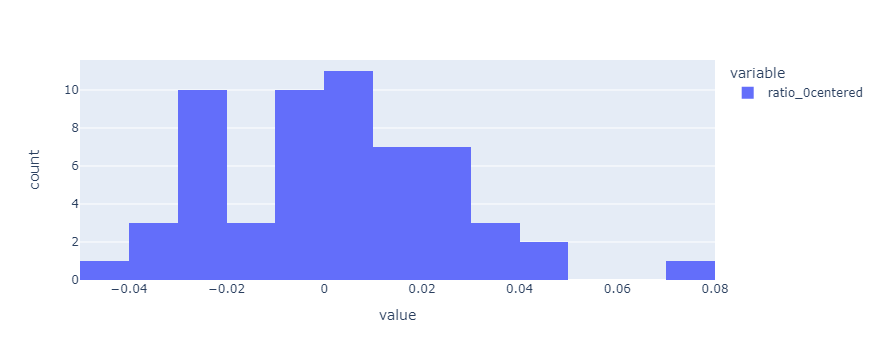

In [609]:
eggs['ratio_0centered'] = eggs['ratio'] - np.mean(eggs['ratio'])
ratio0 = eggs.groupby("motherName").mean().reset_index()[['ratio_0centered']]
px.histogram(ratio0, nbins=20)

In [617]:
ratio0 = eggs.groupby("motherName").mean().reset_index()[['motherName', 'ratio_0centered']]
ratio0.to_csv("egg_shape_ratio_0centered.tsv", sep="\t", index=False)

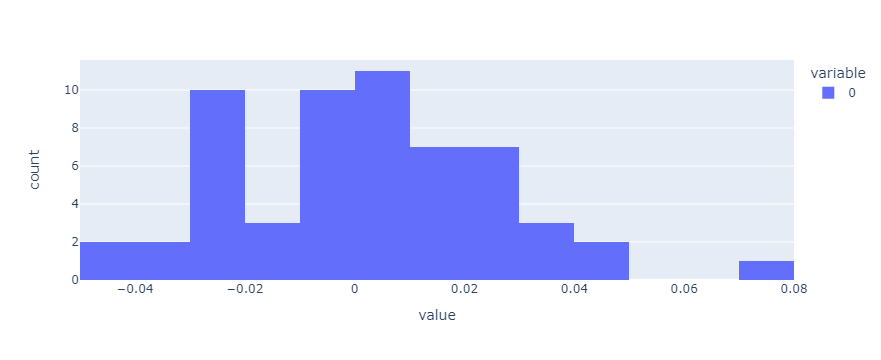

In [614]:
b = tfb.Log1p()
px.histogram(b(ratio0), nbins=20)

In [495]:
eggs_ageknown.shape[0]

282

In [506]:
surrogate_posterior = tfp.experimental.vi.build_factored_surrogate_posterior(
    event_shape=joint.event_shape_tensor()[:-1],
    constraining_bijectors=[tfb.Softplus(), tfb.Softplus(), None, None, None])

In [507]:
optimizer = tf.optimizers.Adam(learning_rate=1e-3)

losses = tfp.vi.fit_surrogate_posterior(
    target_log_prob_fn, 
    surrogate_posterior,
    optimizer=optimizer,
    num_steps=8192*8,
    seed=42,
    sample_size=eggs_ageknown.shape[0])

(ratio_scale_, 
 output_scale_,
 intercept_, 
 age_effect_prior_,
 mother_prior_), _ = surrogate_posterior.distribution.sample_distributions()

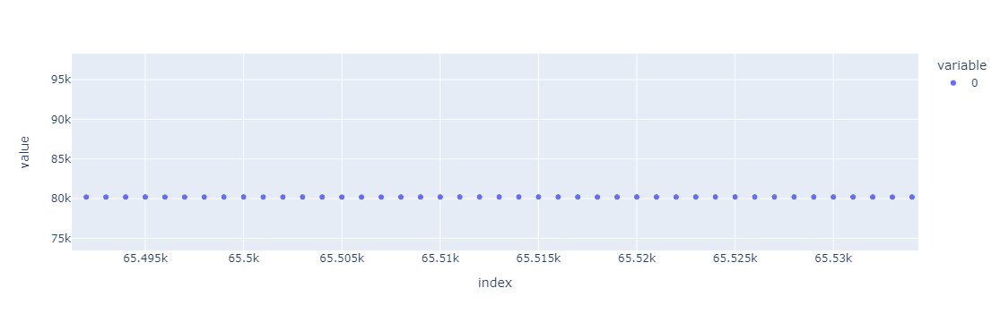

In [508]:
px.scatter(losses)

In [509]:
[age_effect_prior_.mean(), age_effect_prior_.stddev()]

[<tf.Tensor: shape=(), dtype=float32, numpy=0.026952613>,
 <tf.Tensor: shape=(), dtype=float32, numpy=6.6744265e-05>]

In [510]:
mother_prior_.mean()

<tf.Tensor: shape=(38,), dtype=float32, numpy=
array([ 2.74777631e-05, -1.21524245e-05, -4.56764319e-05,  4.17584706e-05,
       -1.43847456e-05,  9.46291584e-06, -5.54803119e-05,  1.21353742e-06,
        3.73654620e-05,  4.15068644e-06,  6.32379451e-05,  1.14899703e-05,
       -2.31071663e-05, -3.12650227e-05,  7.19549280e-06, -3.16257683e-05,
        2.95940754e-05, -8.26124597e-06, -2.25777439e-05, -2.57452411e-05,
       -3.46702436e-05, -2.13257717e-05,  2.03417549e-05, -2.18632813e-05,
       -7.16819486e-05,  2.01676085e-05, -2.22035178e-05,  3.18825259e-05,
       -4.61582094e-05,  3.25407964e-05, -6.49750582e-05,  8.07094693e-07,
       -2.51480124e-05,  4.26785755e-06, -2.76573082e-05, -1.80655770e-05,
       -1.43002471e-05, -3.51565141e-05], dtype=float32)>

In [511]:
[tfb.Softplus()(ratio_scale_.mean()), tfb.Softplus()(output_scale_.mean()), intercept_.mean(), intercept_.stddev(), mother_prior_.mean()]

[<tf.Tensor: shape=(), dtype=float32, numpy=4.529675e-05>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.021312308>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.6277184>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.00078080466>,
 <tf.Tensor: shape=(38,), dtype=float32, numpy=
 array([ 2.74777631e-05, -1.21524245e-05, -4.56764319e-05,  4.17584706e-05,
        -1.43847456e-05,  9.46291584e-06, -5.54803119e-05,  1.21353742e-06,
         3.73654620e-05,  4.15068644e-06,  6.32379451e-05,  1.14899703e-05,
        -2.31071663e-05, -3.12650227e-05,  7.19549280e-06, -3.16257683e-05,
         2.95940754e-05, -8.26124597e-06, -2.25777439e-05, -2.57452411e-05,
        -3.46702436e-05, -2.13257717e-05,  2.03417549e-05, -2.18632813e-05,
        -7.16819486e-05,  2.01676085e-05, -2.22035178e-05,  3.18825259e-05,
        -4.61582094e-05,  3.25407964e-05, -6.49750582e-05,  8.07094693e-07,
        -2.51480124e-05,  4.26785755e-06, -2.76573082e-05, -1.80655770e-05,
        -1.43002471e-05, -3.5156514

In [512]:
surrogate_posterior = tfp.experimental.vi.build_factored_surrogate_posterior(
    event_shape=joint.event_shape_tensor()[:-1],
    constraining_bijectors=[tfb.Softplus(), tfb.Softplus(), None, None, None])

In [574]:
Root = tfd.JointDistributionCoroutine.Root

eggs.motherName = eggs.motherName.astype("category")

def make_joint_distribution_coroutine(mother, n_mothers):

  def model():
    ratio_scale = yield tfd.HalfNormal(scale=1e-5, name='ratio_scale_prior')
    output_scale = yield tfd.HalfNormal(scale=1e-4, name='output_scale_prior')
    intercept = yield tfd.Normal(loc=0.76075816, scale=1e-3, name='intercept_prior')
    mother_prior = yield tfd.Normal(loc=tf.zeros(n_mothers),
                                    scale=ratio_scale,
                                    name='mother_prior')
    mother_effect = tf.gather(mother_prior, mother, axis=-1)

    response = intercept + mother_effect
    yield tfd.Normal(loc=response, scale=output_scale, name='likelihood')
  return tfd.JointDistributionCoroutineAutoBatched(model)

joint = make_joint_distribution_coroutine(
    eggs.motherName.cat.codes.values.astype("int32"), 
    eggs.motherName.nunique())

# Define a closure over the joint distribution 
# to condition on the observed labels.
def target_log_prob_fn(*args):
  return joint.log_prob(*args, likelihood=eggs['ratio'])

In [575]:
num_results = 50000
num_burnin_steps = int(0.25 * num_results)

def init(shape):
    return tf.random.uniform(shape, 1e-6, 1e-4)

# Improve performance by tracing the sampler using `tf.function`
# and compiling it using XLA.
@tf.function(autograph=False)
def do_sampling():
  return tfp.mcmc.sample_chain(
      num_results=num_results,
      num_burnin_steps=num_burnin_steps,
      current_state=[
          init([]), # Ratio Scale
          init([]), # Output Scale
          np.mean(eggs['ratio']).astype("float32"), # Intercept
          # 0.06, # Age Effect
          init([eggs.motherName.nunique()]) # Mother_prior
      ],
      kernel=tfp.mcmc.DualAveragingStepSizeAdaptation(
          tfp.mcmc.NoUTurnSampler(
              target_log_prob_fn=target_log_prob_fn,
              step_size=0.4,
              ),
          num_adaptation_steps=int(0.8*num_burnin_steps)
      )
  )

In [576]:
states, kernel_results = do_sampling()

num_accepted = np.sum(kernel_results.inner_results.is_accepted)
print('Acceptance rate: {}'.format(num_accepted / num_results))

/home/josephguhlin/miniconda3/envs/kakapophenos/lib/python3.8/site-packages/tensorflow_probability/python/mcmc/sample.py:341: UserWarning:

Tracing all kernel results by default is deprecated. Set the `trace_fn` argument to None (the future default value) or an explicit callback that traces the values you are interested in.



Acceptance rate: 0.73432


In [577]:
# ratio_scale_, output_scale_, intercept_, age_effect_, mothers_ = states
ratio_scale_, output_scale_, intercept_, mothers_ = states

In [586]:
[ratio_scale_, output_scale_, intercept_]

[<tf.Tensor: shape=(40000,), dtype=float32, numpy=
 array([2.2097773e-05, 1.8540955e-05, 1.4264378e-05, ..., 1.2021621e-05,
        1.1488027e-05, 1.4265421e-05], dtype=float32)>,
 <tf.Tensor: shape=(40000,), dtype=float32, numpy=
 array([0.00903694, 0.00902039, 0.00903327, ..., 0.0089208 , 0.00894929,
        0.00895107], dtype=float32)>,
 <tf.Tensor: shape=(40000,), dtype=float32, numpy=
 array([0.75626045, 0.75629187, 0.75631374, ..., 0.75524294, 0.7552567 ,
        0.75525755], dtype=float32)>]

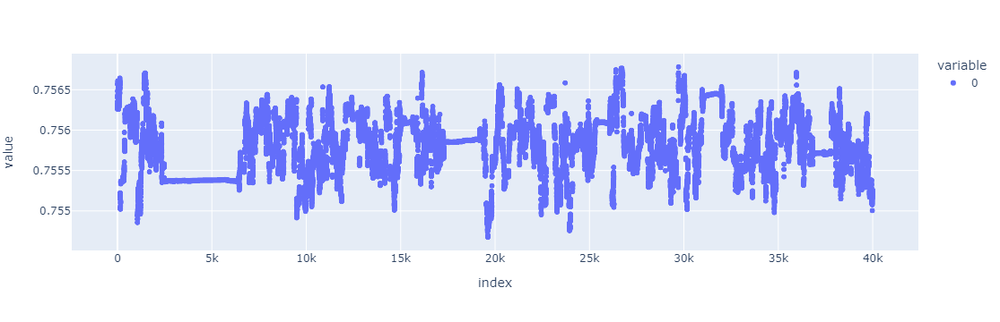

In [587]:
px.scatter(intercept_)

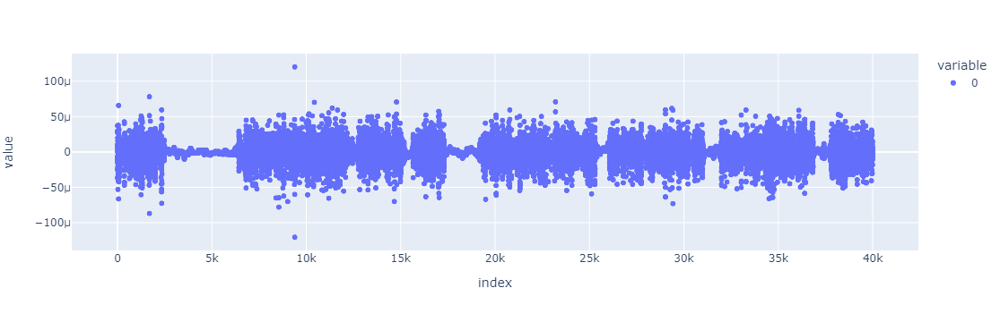

In [589]:
px.scatter(mothers_[:, 5])

In [597]:
np.mean(mothers_, axis=0)

(58,)

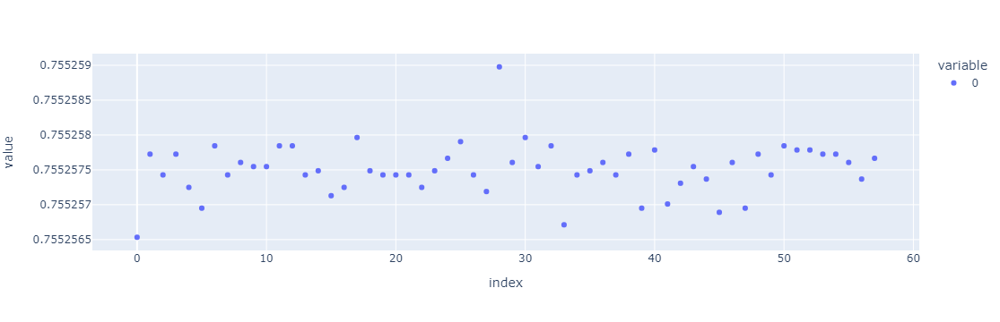

In [598]:
px.scatter(intercept_[-1] + np.mean(mothers_, axis=0))

In [585]:
mothers_[:, -1]

<tf.Tensor: shape=(40000,), dtype=float32, numpy=
array([ 2.9482931e-05,  2.2934386e-05,  2.3450004e-05, ...,
       -2.2843351e-06,  1.4206751e-05,  1.4099597e-05], dtype=float32)>

In [583]:
ratio_scale_ = ratio_scale_[5000:]
output_scale_ = output_scale_[5000:]
intercept_ = intercept_[5000:]
age_effect_ = age_effect_[5000:]
mothers_ = mothers_[5000:]


In [ ]:
px.scatter(age_effect_)

In [ ]:
px.line(states[4][:, 0])

In [ ]:
[np.mean(states[4][5000:, 0]), np.std(states[4][5000:, 0])]

In [ ]:
[np.mean(states[3][5000:]), np.std(states[3][5000:])]

In [281]:
states[4][:, 1]

<tf.Tensor: shape=(20000,), dtype=float32, numpy=
array([-7.4735567e-08,  1.3646392e-05, -6.6223525e-05, ...,
        1.7077389e-06,  7.7145642e-06, -3.8662615e-06], dtype=float32)>

In [206]:
[eggs['year'].min(), eggs['year'].max()]

[1985, 2019]

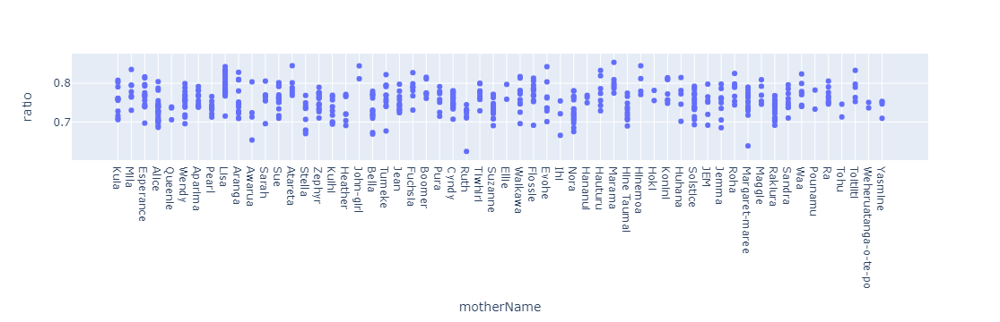

In [207]:
px.scatter(eggs, x="motherName", y="ratio")

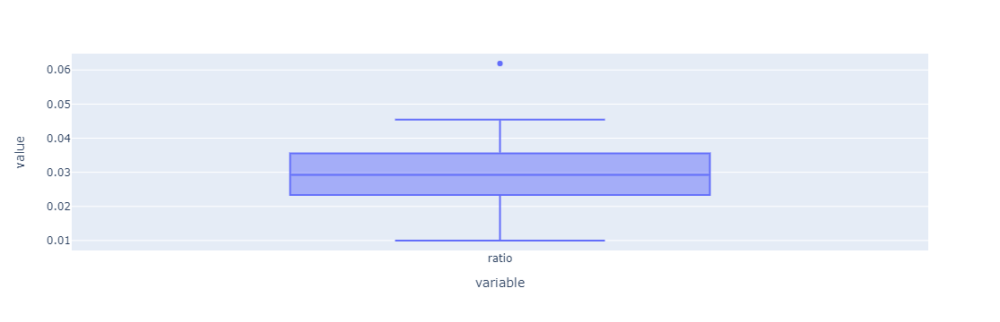

In [37]:
px.box(eggs.groupby("motherName").std()['ratio'])

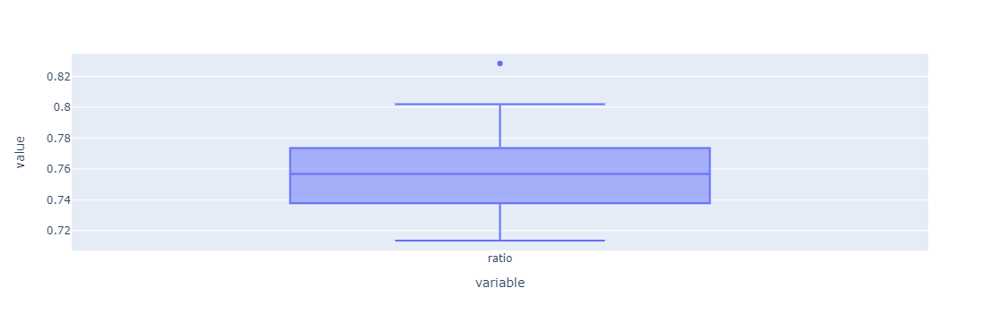

In [38]:
px.box(eggs.groupby("motherName").mean()['ratio'])

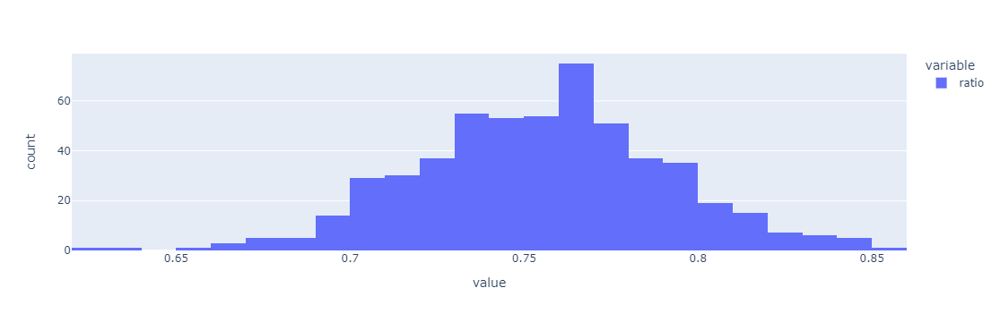

In [39]:
px.histogram(eggs['ratio'])

In [40]:
eggs_ratio = eggs['ratio']
eggs_ratio = eggs_ratio[~np.isnan(eggs_ratio)]
np.mean(tfd.Normal(0.75, 0.034).log_prob(eggs_ratio))

1.8997239

In [41]:
eggs

,birdName,sex,alive,dateLaid,dateHatched,motherName,nestMotherName,layIsland,length,width,weight,day,month,year,yearmonth,ratio,weight_standin
0,Acheron,Male,True,2019-02-15 01:00:00,2019-03-17 07:20:00,Kuia,Roha,Anchor,49.59,39.21,NaN,46.0,2.0,2019,2019 2,0.790684,1944.4239
1,Adelaide,Female,True,2016-02-26 22:00:00,2016-03-25 07:15:00,Kuia,Hauturu,Anchor,49.55,37.60,NaN,57.0,2.0,2016,2016 2,0.758829,1863.0800
2,Adler,Male,False,1981-02-05 00:00:00,1981-03-07 00:00:00,Nora,Nora,Stewart,NaN,NaN,NaN,36.0,2.0,1981,1981 2,NaN,NaN
3,Aio,Female,True,2019-01-17 13:30:00,2019-02-13 19:27:00,Mila,Atareta,Anchor,49.50,39.33,NaN,17.0,1.0,2019,2019 1,0.794545,1946.8350
4,Ako,Female,True,2019-02-13 23:00:00,2019-03-14 00:34:00,Esperance,Esperance,Whenua Hou,43.69,33.88,NaN,44.0,2.0,2019,2019 2,0.775463,1480.2172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
755,Zephyr1.3a.02,NaN,False,2002-02-07 00:00:00,NaN,Zephyr,NaN,Whenua Hou,51.80,40.90,44.75,38.0,2.0,2002,2002 2,0.789575,2118.6200
756,Zephyr2.2b.02,Male,False,2002-03-15 00:00:00,NaN,Zephyr,NaN,Whenua Hou,54.10,39.60,42.50,74.0,3.0,2002,2002 3,0.731978,2142.3600
757,Zephyr2.3a.02,NaN,False,2002-02-10 00:00:00,NaN,Zephyr,NaN,Whenua Hou,53.10,40.50,45.25,41.0,2.0,2002,2002 2,0.762712,2150.5500
758,Zephyr3.3.92,NaN,False,1992-03-13 00:00:00,1992-04-12 00:00:00,Zephyr,Zephyr,Whenua Hou,NaN,NaN,NaN,73.0,3.0,1992,1992 3,NaN,NaN


In [42]:
egg_ratio_means = eggs[['motherName', 'ratio']].groupby('motherName').mean()

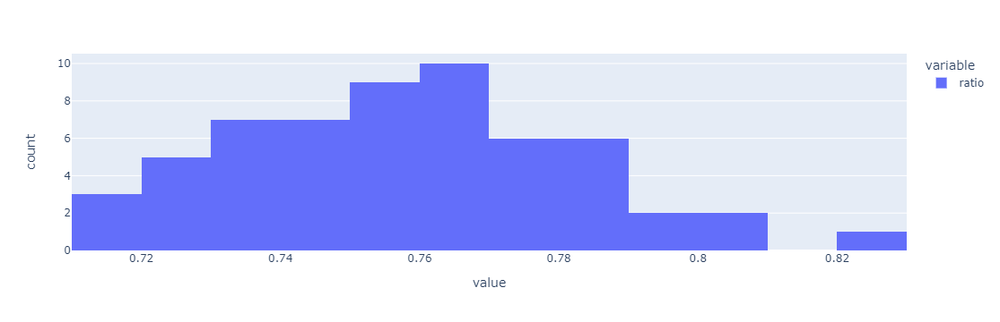

In [43]:
px.histogram(egg_ratio_means)

In [44]:
egg_ratio_means.dropna(inplace=True)

In [45]:
egg_ratio_means.to_csv("egg_ratio_means_early.tsv", sep="\t", index="motherName")

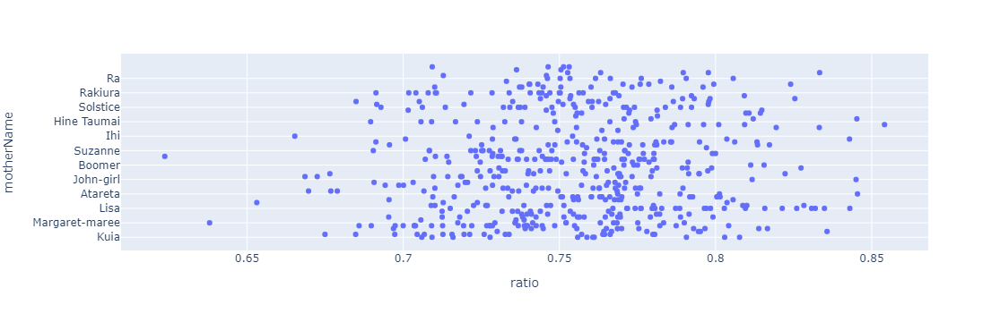

In [46]:
px.scatter(eggs, x="ratio", y="motherName")

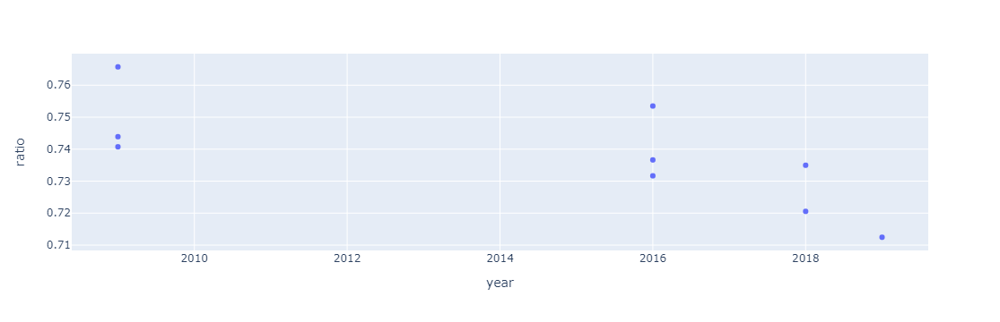

In [47]:
px.scatter(eggs[eggs['motherName'] == "Pearl"], x="year", y="ratio")

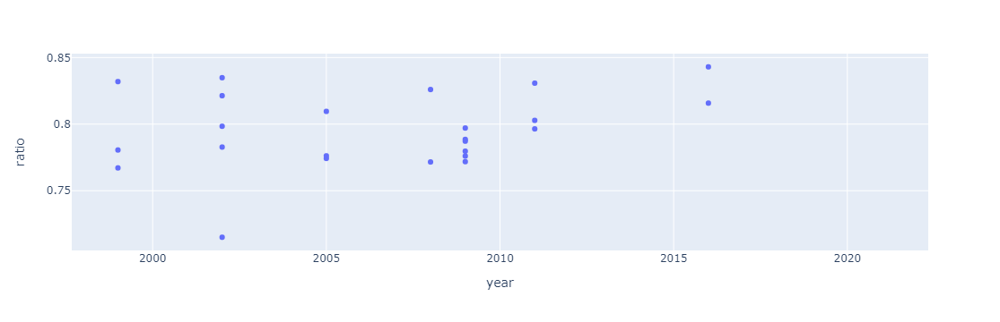

In [48]:
px.scatter(eggs[eggs['motherName'] == "Lisa"], x="year", y="ratio")

In [49]:
eggs.groupby("motherName").count()

,birdName,sex,alive,dateLaid,dateHatched,nestMotherName,layIsland,length,width,weight,day,month,year,yearmonth,ratio,weight_standin
motherName,,,,,,,,,,,,,,,,
Alice,28,17,28,28,9,10,28,26,26,17,28,28,28,28,26,26
Aparima,11,10,11,11,5,7,11,10,10,2,11,11,11,11,10,10
Aranga,16,8,16,16,5,12,16,13,13,2,16,16,16,16,13,13
Atareta,6,6,6,6,3,3,6,6,6,0,6,6,6,6,6,6
Awarua,4,4,4,4,3,4,4,4,4,0,4,4,4,4,4,4
Bella,14,8,14,14,7,9,14,14,14,5,14,14,14,14,14,14
Boomer,8,6,8,8,3,5,8,6,6,0,8,8,8,8,6,6
Cyndy,31,18,31,31,9,13,31,23,23,17,31,31,31,31,23,23
Ellie,2,2,2,2,0,0,2,2,2,0,2,2,2,2,2,2
